# Importing libraries

In [1]:
import glob
import os

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split

from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense,Flatten
from tensorflow.keras import Model,Input

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import cv2
from PIL import Image

### Loading and pre-processing the data

In [ ]:
train_image = []
train_annotation = []

image_file = glob.glob("/kaggle/input/drone-dataset-uav/drone_dataset_yolo/dataset_txt/*.jpg")

for i in image_file:     #slicing for insufficient memory
    Load_image = Image.open(i).convert('RGB')
    nmpy_img = Load_image.resize((256, 256))
    train_image.append(np.asarray(nmpy_img))
    
    seperate_path = i.split('.')
    seperate_path[1] = '.txt'
    
    with open(seperate_path[0]+seperate_path[1]) as f:
        lines = f.readlines()
        tmp_lst = lines[0].split(' ')
        #label = int(tmp_lst[0])
        startX = float(tmp_lst[1])
        startY = float(tmp_lst[2])
        endX = float(tmp_lst[3])
        endY = float(tmp_lst[4])
        train_annotation.append((startX, startY, endX, endY))

### Displaying sample images

In [ ]:
print(len(train_image))

plt.figure(figsize=(15, 15))

for i in range(15):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(train_image[i].astype("uint8"))
    plt.axis("off")

### Splitting the data into training and testing sets

In [ ]:
from sklearn.model_selection import train_test_split
data = np.array(train_image, dtype='float32') / 255.0   # memory not sufficient !!
targets = np.array(train_annotation, dtype='float32')

split = train_test_split(data, targets, test_size=0.10, random_state=42)

(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]

# Printing the shapes of the data and targets arrays

data.shape, targets.shape

# VGG16

### Building model

In [ ]:
from tensorflow.keras.layers import Dense,Flatten
from tensorflow.keras import Model,Input

def build_vggmodel():
    vgg = tf.keras.applications.vgg16.VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(256, 256, 3)))

    vgg.trainable = True

    flatten = vgg.output
    flatten = Flatten()(flatten)

    bboxHead = Dense(128, activation="relu")(flatten)
    bboxHead = Dense(64, activation="relu")(bboxHead)
    bboxHead = Dense(32, activation="relu")(bboxHead)
    bboxHead = Dense(4, activation="linear")(bboxHead)

    vggmodel = Model(inputs=vgg.input, outputs=bboxHead)
    
    return vggmodel

vggmodel = build_vggmodel()

vggmodel.summary()

## Compiling and training the model

In [ ]:
vggmodel.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse', metrics=['accuracy'])

save_best = tf.keras.callbacks.ModelCheckpoint("VGGModel.h5",monitor='val_loss',save_best_only=True, verbose=1)

historyvgg= vggmodel.fit(
    trainImages,
    trainTargets,
    validation_split=0.2,
    batch_size= 16,
    epochs=50,
    verbose=1,
    callbacks=[save_best]
)

### Predictions on test images

In [ ]:
vggmodel = tf.keras.models.load_model('VGGModel.h5')

vggmodel.predict(testImages[:10], verbose=1)

### Performance

#### Acccuracy vs No. of epochs graph

In [ ]:
print('Final Training Accuracy:', historyvgg.history['accuracy'][-1])
print('Final Validation Accuracy:', historyvgg.history['val_accuracy'][-1])

plt.plot(historyvgg.history['accuracy'], label='Training Accuracy')
plt.plot(historyvgg.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch VGG16')
plt.legend()
plt.show()

#### Loss vs No. of epochs graph

In [ ]:
print('Final Training Loss:', historyvgg.history['loss'][-1])
print('Final Validation Loss:', historyvgg.history['val_loss'][-1])

plt.plot(historyvgg.history['loss'], label='Training Loss')
plt.plot(historyvgg.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch VGG16')
plt.legend()
plt.show()

### Evaluating on test images

In [ ]:
loss, accuracy = vggmodel.evaluate(testImages, testTargets, verbose=1)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

# Resnet50

### Building model

In [ ]:
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras import Model, Input

def build_resnetmodel():
    resnet = tf.keras.applications.ResNet50(weights="imagenet", include_top=False, input_tensor=Input(shape=(256, 256, 3)))

    resnet.trainable = True

    flatten = resnet.output
    flatten = Flatten()(flatten)

    bboxHead = Dense(128, activation="relu")(flatten)
    bboxHead = Dense(64, activation="relu")(bboxHead)
    bboxHead = Dense(32, activation="relu")(bboxHead)
    bboxHead = Dense(4, activation="linear")(bboxHead)

    resnetmodel = Model(inputs=resnet.input, outputs=bboxHead)
    
    return resnetmodel

resnetmodel = build_resnetmodel()

resnetmodel.summary()

### Compiling and training the model

In [ ]:
resnetmodel.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse', metrics=['accuracy'])

save_best = tf.keras.callbacks.ModelCheckpoint("RESNETModel.h5", verbose=1)

historyresnet= resnetmodel.fit(
    trainImages, trainTargets,
    validation_split=0.2,
    batch_size= 16,
    epochs=50,
    verbose=1,
    callbacks=[save_best])

### Predictions on test images

In [ ]:
resnetmodel = tf.keras.models.load_model('./RESNETModel.h5')

resnetmodel.predict(testImages[:10], verbose=1)

### Performance

#### Acccuracy vs No. of epochs graph

In [ ]:
print('Final Training Accuracy:', historyresnet.history['accuracy'][-1])
print('Final Validation Accuracy:', historyresnet.history['val_accuracy'][-1])

plt.plot(historyresnet.history['accuracy'], label='Training Accuracy')
plt.plot(historyresnet.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch RESNET50')
plt.legend()
plt.show()

#### Loss vs No. of epochs graph

In [ ]:
print('Final Training Loss:', historyresnet.history['loss'][-1])
print('Final Validation Loss:', historyresnet.history['val_loss'][-1])

plt.plot(historyresnet.history['loss'], label='Training Loss')
plt.plot(historyresnet.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch RESNET50')
plt.legend()
plt.show()

### Evaluating on test images

In [ ]:
loss, accuracy = resnetmodel.evaluate(testImages, testTargets, verbose=1)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

## YOLOv8

In [ ]:
!pip install -q ultralytics

## Setup dataset

In [ ]:
import shutil
from tqdm import tqdm

DATA_DIR = "/kaggle/input/drone-dataset-uav/drone_dataset_yolo/dataset_txt"

images = []
labels = []
image_paths = glob.glob(os.path.join(DATA_DIR, "*.jpg"))

for image_path in tqdm(image_paths):     #slicing for insufficient memory
    images.append(image_path)
    label_path = image_path.split('.')[0] + '.txt'
    labels.append(label_path)


In [ ]:
from sklearn.model_selection import train_test_split
split = train_test_split(images, labels, test_size=0.10, random_state=42)

(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]

In [ ]:
TRAIN_IMAGE_DIR = 'train/images'
TRAIN_LABEL_DIR = 'train/labels'
VAL_IMAGE_DIR = 'valid/images'
VAL_LABEL_DIR = 'valid/labels'

os.makedirs(TRAIN_IMAGE_DIR, exist_ok=True)
os.makedirs(TRAIN_LABEL_DIR, exist_ok=True)

os.makedirs(VAL_IMAGE_DIR, exist_ok=True)
os.makedirs(VAL_LABEL_DIR, exist_ok=True)

for path in tqdm(trainImages):
    shutil.copyfile(path, os.path.join(TRAIN_IMAGE_DIR, os.path.basename(path)))

for path in tqdm(testImages):
    shutil.copyfile(path, os.path.join(VAL_IMAGE_DIR, os.path.basename(path)))

for path in tqdm(trainTargets):
    shutil.copyfile(path, os.path.join(TRAIN_LABEL_DIR, os.path.basename(path)))

for path in tqdm(testTargets):
    shutil.copyfile(path, os.path.join(VAL_LABEL_DIR, os.path.basename(path)))

In [ ]:
%%writefile drone.yaml

path: /kaggle/working
train: train/images
val: valid/images

nc: 1

# Classes
names: ['drone']

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir ultralytics/runs

In [2]:
# Disable wandb
import os
os.environ['WANDB_DISABLED'] = 'true'

In [3]:
from ultralytics import YOLO
# Load a model
# model = YOLO("yolov8s.yaml")  # build a new model from scratch
model = YOLO("yolov8s.pt")  # load a pretrained model (recommended for training)

In [4]:
# Use the model
results = model.train(
   data='drone.yaml',
   imgsz=256,
   epochs=30,
   batch=8,
   name='yolov8s_v8_50e'
)  # train the model

Ultralytics YOLOv8.0.114 🚀 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=drone.yaml, epochs=30, patience=50, batch=8, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_v8_50e, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, forma

  0%|          | 0.00/755k [00:00<?, ?B/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


  0%|          | 0.00/6.23M [00:00<?, ?B/s]

AMP: checks passed ✅
train: Scanning /kaggle/working/train/labels... 1223 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1223/1223 [00:01<00:00, 678.14it/s]
train: WARNING ⚠️ /kaggle/working/train/images/pic_722.jpg: corrupt JPEG restored and saved
train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: Scanning /kaggle/working/valid/labels... 136 images, 0 backgrounds, 0 corrupt: 100%|██████████| 136/136 [00:00<00:00, 406.38it/s]
val: New cache created: /kaggle/working/valid/labels.cache
Plotting labels to runs/detect/yolov8s_v8_50e/labels.jpg... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 256 train, 256 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8s_v8_50e
Starting training for 30 epochs...



## Visualize performance

In [5]:
import math
import random

# Plot and visualize images in a 2x2 grid.
def visualize(result_dir, num_samples=None, num_cols=1):
    """
    Function accepts a list of images and plots
    """
    image_names = sorted(glob.glob(os.path.join(result_dir, '*.jpg')))
    
    if num_samples is not None:
        image_names = random.sample(image_names, num_samples)
        
    num_images = len(image_names)
    num_rows = int(math.ceil(num_images / num_cols))
    plt.figure(figsize=(12 * num_cols, 6 * num_rows))
    
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

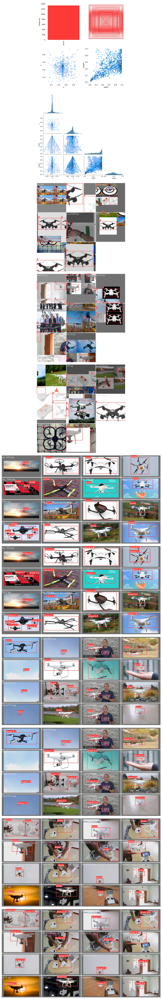

In [6]:
visualize('runs/detect/yolov8s_v8_50e', num_cols=1)

## Inference on Validation Images


image 1/136 /kaggle/working/valid/images/0001.jpg: 128x256 5 drones, 21.6ms
image 2/136 /kaggle/working/valid/images/0004.jpg: 192x256 1 drone, 23.1ms
image 3/136 /kaggle/working/valid/images/0010.jpg: 192x256 2 drones, 18.8ms
image 4/136 /kaggle/working/valid/images/0020.jpg: 256x256 1 drone, 24.6ms
image 5/136 /kaggle/working/valid/images/0042.jpg: 192x256 1 drone, 20.7ms
image 6/136 /kaggle/working/valid/images/0056.jpg: 256x256 1 drone, 29.0ms
image 7/136 /kaggle/working/valid/images/0065.jpg: 192x256 1 drone, 32.2ms
image 8/136 /kaggle/working/valid/images/0214.jpg: 256x256 1 drone, 16.8ms
image 9/136 /kaggle/working/valid/images/0226.jpg: 128x256 1 drone, 17.3ms
image 10/136 /kaggle/working/valid/images/0230.jpg: 160x256 1 drone, 22.2ms
image 11/136 /kaggle/working/valid/images/0238.jpg: 160x256 1 drone, 16.0ms
image 12/136 /kaggle/working/valid/images/0250.jpg: 160x256 1 drone, 13.8ms
image 13/136 /kaggle/working/valid/images/0262.jpg: 128x256 1 drone, 14.1ms
image 14/136 /kagg

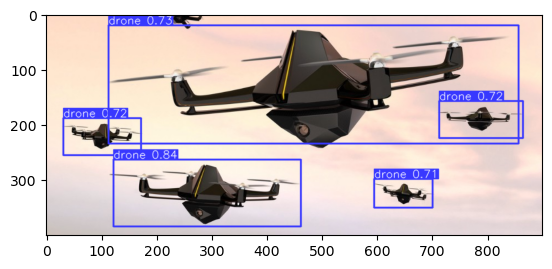

In [7]:
# results = model("/kaggle/input/drone-dataset-uav/drone_dataset_yolo/dataset_txt/0014.jpg", conf=0.5, agnostic_nms=True, iou=0.5)  # predict on an image
results = model("valid/images", conf=0.5, agnostic_nms=True, iou=0.5, save=True)
res_plotted = results[0].plot()
plt.imshow(res_plotted)
plt.show()

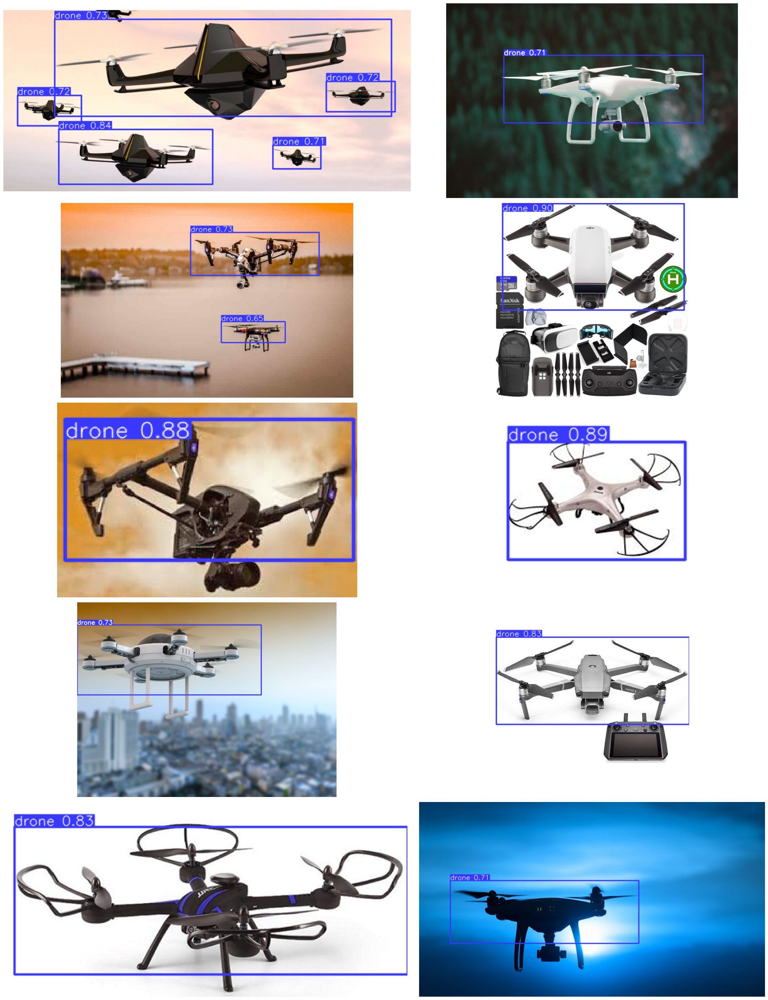

In [8]:
indices = list(range(len(results)))
random_indices = random.sample(indices, 10)
num_cols = 2
num_rows = 5

plt.figure(figsize=(12 * num_cols, 6 * num_rows))
    
for i, idx in enumerate(random_indices):
    image = results[i].plot()
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [9]:
success = model.export(format="onnx")  # export the model to ONNX format
success

Ultralytics YOLOv8.0.114 🚀 Python-3.7.12 torch-1.13.0 CPU

PyTorch: starting from runs/detect/yolov8s_v8_50e/weights/best.pt with input shape (8, 3, 256, 256) BCHW and output shape(s) (8, 5, 1344) (21.4 MB)

ONNX: starting export with onnx 1.13.1 opset 16...
ONNX: export success ✅ 1.5s, saved as runs/detect/yolov8s_v8_50e/weights/best.onnx (42.5 MB)

Export complete (2.6s)
Results saved to /kaggle/working/runs/detect/yolov8s_v8_50e/weights
Predict:         yolo predict task=detect model=runs/detect/yolov8s_v8_50e/weights/best.onnx imgsz=256 
Validate:        yolo val task=detect model=runs/detect/yolov8s_v8_50e/weights/best.onnx imgsz=256 data=drone.yaml 
Visualize:       https://netron.app


'runs/detect/yolov8s_v8_50e/weights/best.onnx'